In [ ]:
!pip install opendatasets --upgrade --quiet

In [ ]:
import opendatasets as od
#You: {"username":"jayghanta","key":"b9553c21d2276cf8e83aa95c89b73afb"}

dataset_url = 'https://www.kaggle.com/datasets/sachinkumar413/alzheimer-mri-dataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username:

In [ ]:
import os
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


%matplotlib inline

class DataFetcher(object):
    def __init__(self, data_dir, image_sz, batch_sz, stats, train_pct):
        self.data_dir = data_dir
        self.image_sz = image_sz
        self.batch_sz = batch_sz
        self.stats = stats
        self.train_pct = train_pct


    def denorm(self, img_tensors):
        return img_tensors * self.stats[1][0] + self.stats[0][0]

    def show_images(self, images, labels, nmax=64):
        fig, ax = plt.subplots(figsize=(16, 8)) #Showing 128 images, 16 rows and 8 columns
        # plt.xlabel(labels)
        ax.set_xticks(labels); ax.set_yticks([])
        ax.imshow(make_grid(self.denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

    def show_batch(self, dl, nmax=64):
        for images, labels in dl:
            self.show_images(images, labels, nmax)
            #plt.show(images)
            break #showing only first batch
    def load_data(self):
        root_dir = os.listdir(self.data_dir)[0] #listing directories
        print("root directory", root_dir)
        print("Data directories:")
        list_dl=[]

        # This function does couple of things
        # a) It fetches all the images together with it's lables. Data with different classes is organized
        # by separate folders
        # b) converting image to tensor 4 dimensions: (batch, channel, 64 pixel, 64 pixel)
        # c) It normalizes the data. In our case from -1 to 1

        dataset = ImageFolder(root = self.data_dir + "/" + root_dir,
                        transform=T.Compose([
                        T.Resize(self.image_sz),
                        T.CenterCrop(self.image_sz),
                        T.ToTensor(), #converting image to tensor 4 dimensions: (batch, channel, 64 pixel, 64 pixel)
                        T.Normalize(*self.stats)]))

        print("classes:", dataset.classes)
        print("dataset sz:", len(dataset))
        train_size = int(self.train_pct * len(dataset))
        sizes = [train_size, len(dataset) - train_size]

        #It shuffles the data and gives the train and test datasets based on the given sizes
        # By using the same seed shuffling can always be repeated
        train_ds, test_ds = torch.utils.data.random_split(dataset, sizes, generator=torch.Generator().manual_seed(8192))
        print("train, test classes:", train_ds.dataset.classes, test_ds.dataset.classes)
        print("train, test dataset sz:", len(train_ds), len(test_ds))

        self.data_dl = DataLoader(dataset, self.batch_sz, shuffle=True, num_workers=3, pin_memory=True)#gives data in batches by bathc_size
        self.train_dl = DataLoader(train_ds, self.batch_sz, shuffle=True, num_workers=3, pin_memory=True)#gives data in batches by bathc_size
        self.test_dl = DataLoader(test_ds, self.batch_sz, shuffle=True, num_workers=3, pin_memory=True)#gives data in batches by bathc_size
        # for images, labels in self.train_dl:
        #     print(images, labels)
        self.show_batch(self.train_dl)

# loader = data.DataLoader(dataset, batch_size = 8, shuffle = True)
#         for dir in os.listdir(self.data_dir + "/" + root_dir):
#             print(dir)
#             train_ds = ImageFolder(self.data_dir, transform=T.Compose([
#             T.Resize(self.image_sz),
#             T.CenterCrop(self.image_sz),
#             T.ToTensor(), #converting image to tensor 4 dimensions: (batch, channel, 64 pixel, 64 pixel)
#             T.Normalize(*self.stats)]))
#             train_dl = DataLoader(train_ds, self.batch_sz, shuffle=True, num_workers=3, pin_memory=True)#gives data in batches by bathc_size
#             list_dl.append(train_dl)
#             self.show_batch(train_dl)


data_dir = './alzheimer-mri-dataset' #first data goes here
image_size = 64 #condense resolution to 64by64
batch_size = 128 #batches
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5) #normalize mean and stand deviation for rgb channels - removing the abnormal data
#pixel values between minus 1 and 1 for convinience for discriminator training
df = DataFetcher(data_dir, image_size, batch_size, stats, 0.85)
df.load_data()



In [ ]:
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)


def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

def get_default_device():
        """Pick GPU if available, else CPU"""
        if torch.cuda.is_available():
            return torch.device('cuda')
        else:
            return torch.device('cpu')

In [ ]:
device = get_default_device()
print(device)
dev_train_dl = DeviceDataLoader(df.train_dl, device)

cuda


In [ ]:
def train_discriminator(real_images, labels, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

In [ ]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

In [ ]:
# import torch.nn as nn
# #
# discriminator = nn.Sequential(
#     # in: 3 x 64 x 64

#     nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(64),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 64 x 32 x 32

#     nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(128),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 128 x 16 x 16

#     nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(256),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 256 x 8 x 8

#     nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(512), #convert to z-score
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 512 x 4 x 4

#     # nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
#     # # out: 1 x 1 x 1
#     nn.Flatten(),
#     nn.Linear(8192, 4),

#     nn.Flatten(),
#     nn.Sigmoid())
# discriminator = to_device(discriminator, device)


In [ ]:
# import torch.nn.functional as F
# def train_discriminator(real_images, labels, opt_d):
#     # Clear discriminator gradients
#     opt_d.zero_grad()

#     # Pass real images through discriminator
#     real_preds = discriminator(real_images)
#     real_targets = labels


#     real_loss = F.cross_entropy(real_preds, real_targets)
#     # real_score = torch.mean(real_preds).item()
#     real_loss.backward()
#     opt_d.step()
#     return real_loss.item()



In [ ]:
# from tqdm.notebook import tqdm
# import torch.nn.functional as F
# def fit(epochs, lr, train_dl, start_idx=1):
#     torch.cuda.empty_cache()

#     # Losses & scores
#     losses_d = []
#     real_scores = []

#     # Create optimizers
#     opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))


#     for epoch in range(epochs):
#         for real_images, labels in tqdm(train_dl):
#             # Train discriminator
#             loss_d = train_discriminator(real_images, labels, opt_d)
#         # Record losses & scores
#         losses_d.append(loss_d)
#         # real_scores.append(real_score)

#         # Log losses & scores (last batch)
#         print("Epoch [{}/{}],  loss_d: {:.4f}".format(
#             epoch+1, epochs, loss_d))

#         # Save generated images
#         # save_samples(dir_idx, epoch+start_idx, fixed_latent, show=False)
#     print(losses_d)
#     return losses_d
# lr = 0.0002
# epochs = 25

# dev_train_dl = DeviceDataLoader(df.train_dl, device)
# history = fit(epochs, lr, dev_train_dl.dl)


In [ ]:
from torchvision.models import resnet50, ResNet50_Weights, vgg16
torch.cuda.empty_cache()
torch.manual_seed(8192)
net = resnet50(pretrained=True)
# net = vgg16(pretrained=True)
net = net.cuda()
net

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 169MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [ ]:

import torch.nn.functional as F
import torch.nn as nn
from tqdm.notebook import tqdm
import torch.nn.functional as F

def accuracy(out, labels):
    _,pred = torch.max(out, dim=1)
    # print(pred, labels)
    return torch.sum(pred==labels).item()

num_ftrs = net.fc.in_features
net.fc = nn.Linear(num_ftrs, 128) #why 128
net.fc = net.fc.cuda()



# for param in net.parameters():
#     param.requires_grad = False
train_epoch_accuracy = []
test_epoch_accuracy = []
train_epoch_loss = []
test_epoch_loss = []


def fit(epochs, lr, train_dl, test_dl, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores


    # Create optimizers
    opt_d = torch.optim.Adam(net.parameters(), lr=lr, betas=(0.5, 0.999))


    for epoch in range(epochs):
        train_loss = 0
        train_running_accuracy = 0
        for real_images, labels in tqdm(train_dl):
            # Train discriminator
            opt_d.zero_grad()
            real_preds = net(real_images)
            real_targets = labels
            # print("real_preds, labels", real_preds, labels)
            print(real_preds.shape, labels.shape)
            real_loss = F.cross_entropy(real_preds, real_targets)
            real_loss.backward()
            opt_d.step()
            train_loss += real_loss.item()
            sum = accuracy(real_preds, real_targets)
            # print("sum", sum)
            train_running_accuracy += sum
            # loss_d = train_discriminator(real_images, labels, opt_d)
        # real_scores.append(real_score)
        mean_train_loss = train_loss / len(train_dl)
        # print("train_dl length:", len(train_dl.dl.dataset))
        train_accuracy = 100 * (train_running_accuracy / len(train_dl.dl.dataset))
        train_epoch_accuracy.append(train_accuracy)
        train_epoch_loss.append(mean_train_loss)

        with torch.no_grad():
            net.eval()
            test_loss = 0
            test_running_accuracy = 0
            for data_t, target_t in tqdm(test_dl):
                real_preds = net(data_t)

                real_targets = target_t
                loss = F.cross_entropy(real_preds, real_targets)
                test_loss += loss.item()
                test_running_accuracy += accuracy(real_preds, real_targets)
        mean_test_loss = test_loss / len(test_dl)
        test_accuracy = 100 * (test_running_accuracy / len(test_dl.dl.dataset))
        test_epoch_accuracy.append(test_accuracy)
        test_epoch_loss.append(mean_test_loss)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}],  train loss: {:.4f}, train_accuracy: {:.4f}".format(
            epoch+1, epochs, mean_train_loss, train_accuracy))
        print("Mean Test loss: {:.4f}, test_accuracy: {:.4f}", mean_test_loss, test_accuracy)

        # Save generated images
        # save_samples(dir_idx, epoch+start_idx, fixed_latent, show=False)

    torch.save(net, "Discriminator_Model")


lr = 0.0001
epochs = 31

# train_dl = DeviceDataLoader(df.train_dl, device)
dev_test_dl = DeviceDataLoader(df.test_dl, device)

dev_train_dl = DeviceDataLoader(df.train_dl, device)


history = fit(epochs, lr, dev_train_dl, dev_test_dl)




  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [1/31],  train loss: 1.8641, train_accuracy: 59.5037
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 1.1061897575855255 63.125


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [2/31],  train loss: 1.1282, train_accuracy: 49.0625
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 1.0683168768882751 43.854166666666664


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [3/31],  train loss: 0.9234, train_accuracy: 54.2096
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.856953039765358 58.75


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [4/31],  train loss: 0.8557, train_accuracy: 59.0993
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.7770747169852257 63.854166666666664


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [5/31],  train loss: 0.8606, train_accuracy: 59.0993
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.7777649238705635 64.6875


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [6/31],  train loss: 0.8425, train_accuracy: 63.6581
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 1.0319699943065643 51.24999999999999


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [7/31],  train loss: 0.9288, train_accuracy: 55.2941
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.8192193582653999 64.47916666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [8/31],  train loss: 0.7544, train_accuracy: 66.8382
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.6543063744902611 74.47916666666666


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [9/31],  train loss: 0.8096, train_accuracy: 65.2941
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.8047544881701469 62.291666666666664


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [10/31],  train loss: 0.6076, train_accuracy: 76.0478
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.5452003814280033 80.83333333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [11/31],  train loss: 0.4859, train_accuracy: 80.8824
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.4170987010002136 84.47916666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [12/31],  train loss: 0.4195, train_accuracy: 85.3309
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 1.0449322685599327 42.083333333333336


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [13/31],  train loss: 0.3603, train_accuracy: 86.0478
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.2760038897395134 89.79166666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [14/31],  train loss: 0.2117, train_accuracy: 94.8529
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 1.5204861164093018 34.89583333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [15/31],  train loss: 0.5011, train_accuracy: 78.7868
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.39330675825476646 87.5


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [16/31],  train loss: 0.1697, train_accuracy: 94.3199
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.1284879669547081 95.41666666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [17/31],  train loss: 0.0115, train_accuracy: 99.6507
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.09862345363944769 96.5625


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [18/31],  train loss: 0.0071, train_accuracy: 99.7978
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.06428067083470523 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [19/31],  train loss: 0.4733, train_accuracy: 81.8934
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.9705827161669731 48.95833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [20/31],  train loss: 0.7166, train_accuracy: 67.9779
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.6000914797186852 79.375


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [21/31],  train loss: 0.1774, train_accuracy: 94.2096
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.11840875074267387 96.35416666666666


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [22/31],  train loss: 0.0143, train_accuracy: 99.6324
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.06774236960336566 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [23/31],  train loss: 0.0009, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.06772839068435133 97.60416666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [24/31],  train loss: 0.0004, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.06634500273503363 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [25/31],  train loss: 0.0003, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.07274180185049772 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [26/31],  train loss: 0.0002, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.08105323370546103 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [27/31],  train loss: 0.0001, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.07079600362339988 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [28/31],  train loss: 0.0001, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.07408967218361795 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [29/31],  train loss: 0.0001, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.07716690329834819 97.70833333333333


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [30/31],  train loss: 0.0001, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.07777066505514085 97.60416666666667


  0%|          | 0/43 [00:00<?, ?it/s]

torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128, 128]) torch.Size([128])
torch.Size([128,

  0%|          | 0/8 [00:00<?, ?it/s]

Epoch [31/31],  train loss: 0.0001, train_accuracy: 100.0000
Mean Test loss: {:.4f}, test_accuracy: {:.4f} 0.08112029195763171 97.60416666666667


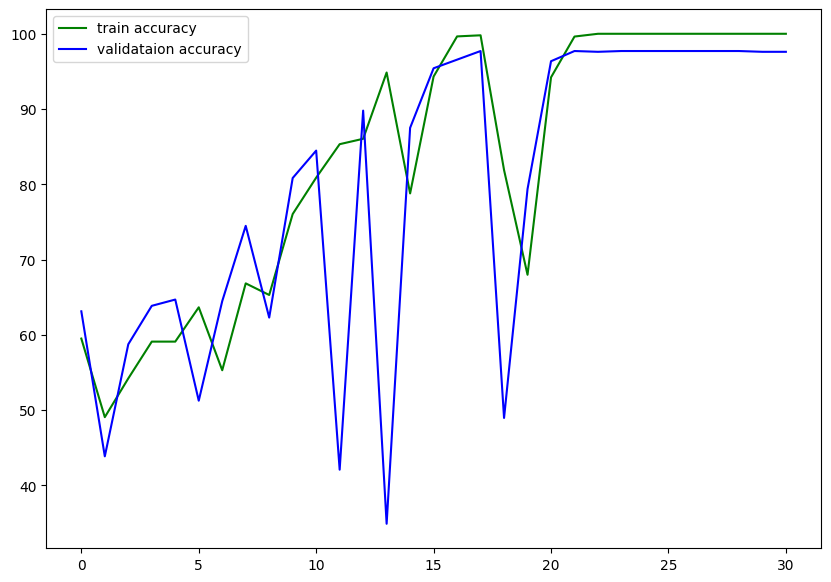

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 7))
plt.plot(train_epoch_accuracy, color='green', label='train accuracy')
plt.plot(test_epoch_accuracy, color='blue', label='validataion accuracy')
plt.legend()
plt.savefig('accuracy.png')
plt.show()


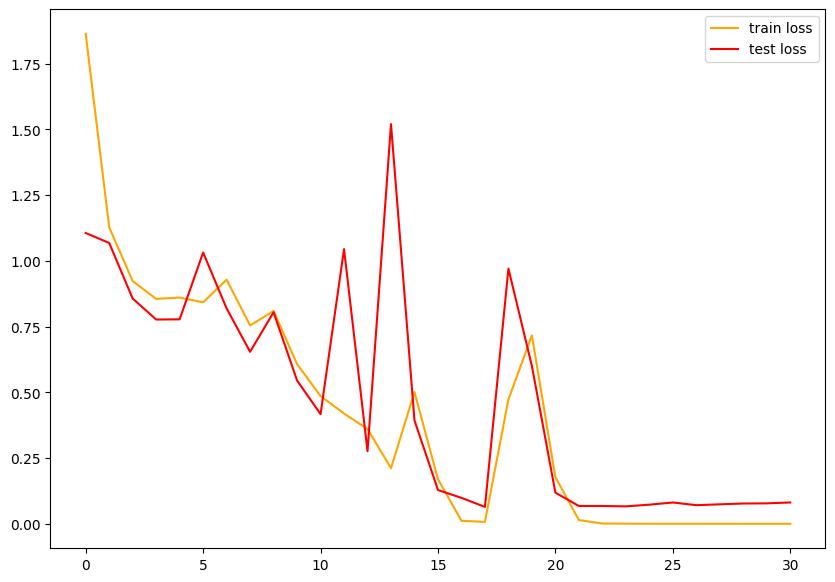

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(train_epoch_loss, color='orange', label='train loss')
plt.plot(test_epoch_loss, color='red', label='test loss')
plt.legend()
plt.savefig('loss.png')
plt.show()

In [ ]:
net = torch.load("Discriminator_Model")
dev_test_dl = DeviceDataLoader(df.test_dl, device)
with torch.no_grad():
    net.eval()
    test_loss = 0
    test_running_accuracy = 0
    for data_t, target_t in tqdm(dev_test_dl):
        real_preds = net(data_t)

        real_targets = target_t
        loss = F.cross_entropy(real_preds, real_targets)
        test_loss += loss.item()
        test_running_accuracy += accuracy(real_preds, real_targets)
        mean_test_loss = test_loss / len(dev_test_dl)
        test_accuracy = 100 * (test_running_accuracy / len(dev_test_dl.dl.dataset))

        # Log losses & scores (last batch)
    print("test loss: {:.4f}, test_accuracy: {:.4f}".format(mean_test_loss, test_accuracy))


  0%|          | 0/8 [00:00<?, ?it/s]

test loss: 0.0771, test_accuracy: 97.6042


In [ ]:
import torch.nn.functional as F
import torch.nn as nn
from tqdm.notebook import tqdm
import torch.nn.functional as F

def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
# discriminator = nn.Sequential(
#     # in: 3 x 64 x 64

#     nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(64),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 64 x 32 x 32

#     nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(128),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 128 x 16 x 16

#     nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(256),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 256 x 8 x 8

#     nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
#     nn.BatchNorm2d(512),
#     nn.LeakyReLU(0.2, inplace=True),
#     # out: 512 x 4 x 4

#     nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
#     # out: 1 x 1 x 1

#     nn.Flatten(),
#     nn.Sigmoid())
# discriminator = to_device(discriminator, device)

class Discriminator(nn.Module):
    def __init__(self, emb_size=28):
        super(Discriminator, self).__init__()
        self.emb_size = emb_size
        self.label_embeddings = nn.Embedding(4, self.emb_size)
        self.model = nn.Sequential(
            nn.Conv2d(3,64,kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(64,64*2,kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64*2),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(64*2,64*4,kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(64*4),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(64*4,64*8,4,2,1,bias=False),
            nn.BatchNorm2d(64*8),
            nn.LeakyReLU(0.2,inplace=True),

            nn.Conv2d(64*8,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Flatten()
        )
        self.model2 = nn.Sequential(
            nn.Linear(284,100),
            nn.LeakyReLU(0.2,inplace=True),
            nn.Linear(100,1),
            nn.Sigmoid()
        )

        self.apply(weights_init)
    def forward(self, input, labels):
        x = self.model(input)
        y = self.label_embeddings(labels)
        input = torch.cat([x, y], 1)
        final_output = self.model2(input)
        return final_output

In [ ]:

!pip install torch_summary
from torchsummary import summary
discriminator = Discriminator().to(device)
summary(discriminator,torch.zeros(28,3,64,64).to(device), torch.zeros(28).long().to(device));


Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 256]                 --
|    └─Conv2d: 2-1                       [-1, 64, 32, 32]          3,072
|    └─BatchNorm2d: 2-2                  [-1, 64, 32, 32]          128
|    └─LeakyReLU: 2-3                    [-1, 64, 32, 32]          --
|    └─Conv2d: 2-4                       [-1, 128, 16, 16]         131,072
|    └─BatchNorm2d: 2-5                  [-1, 128, 16, 16]         256
|    └─LeakyReLU: 2-6                    [-1, 128, 16, 16]         --
|    └─Conv2d: 2-7                       [-1, 256, 8, 8]           524,288
|    └─BatchNorm2d: 2-8                  [-1, 256, 8, 8]           512
|    └─LeakyReLU: 2-9                    [-1, 256, 8, 8]           --
|    └─Conv2d: 2-10                      [-1, 512, 4, 4]           2,097,152
|    └─BatchNorm2d: 2-11                 [-1, 512, 4, 4]           1,024
|    └─LeakyReLU: 2-12                   [-1, 512, 4, 4]   

In [ ]:
#Here we are implementing a conditional generator. It means generating a specific class of data
class Generator(nn.Module):
    def __init__(self, emb_size=28, num_classes=4):
        super(Generator,self).__init__()
        self.emb_size = emb_size
        self.label_embeddings = nn.Embedding(4, self.emb_size)
        self.model = nn.Sequential(
            nn.ConvTranspose2d(100+self.emb_size,64*8,4,1,0,bias=False),
            nn.BatchNorm2d(64*8),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*8,64*4,4,2,1,bias=False),
            nn.BatchNorm2d(64*4),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*4,64*2,4,2,1,bias=False),
            nn.BatchNorm2d(64*2),
            nn.ReLU(True),
            nn.ConvTranspose2d(64*2,64,4,2,1,bias=False),
            nn.BatchNorm2d(64),
            nn.ReLU(True),
            nn.ConvTranspose2d(64,3,4,2,1,bias=False),
            nn.Tanh()
        )
        self.apply(weights_init)
    def forward(self,input_noise,labels):
        label_embeddings = self.label_embeddings(labels).view(len(labels), self.emb_size, 1, 1)
        input = torch.cat([input_noise, label_embeddings], 1)
        return self.model(input)


generator = Generator().to(device)
summary(generator,torch.zeros(28,100,1,1).to(device), torch.zeros(28).long().to(device));

Layer (type:depth-idx)                   Output Shape              Param #
├─Embedding: 1-1                         [-1, 28]                  112
├─Sequential: 1-2                        [-1, 3, 64, 64]           --
|    └─ConvTranspose2d: 2-1              [-1, 512, 4, 4]           1,048,576
|    └─BatchNorm2d: 2-2                  [-1, 512, 4, 4]           1,024
|    └─ReLU: 2-3                         [-1, 512, 4, 4]           --
|    └─ConvTranspose2d: 2-4              [-1, 256, 8, 8]           2,097,152
|    └─BatchNorm2d: 2-5                  [-1, 256, 8, 8]           512
|    └─ReLU: 2-6                         [-1, 256, 8, 8]           --
|    └─ConvTranspose2d: 2-7              [-1, 128, 16, 16]         524,288
|    └─BatchNorm2d: 2-8                  [-1, 128, 16, 16]         256
|    └─ReLU: 2-9                         [-1, 128, 16, 16]         --
|    └─ConvTranspose2d: 2-10             [-1, 64, 32, 32]          131,072
|    └─BatchNorm2d: 2-11                 [-1, 64, 32, 3

In [ ]:
def noise(size):
    n = torch.randn(size, 100, 1, 1, device=device)
    return n.to(device)


In [ ]:
def discriminator_train_step(real_data, real_labels, fake_data, fake_labels):
    d_optimizer.zero_grad()
    prediction_real = discriminator(real_data, real_labels)
    error_real = loss(prediction_real, torch.ones(len(real_data), 1).to(device))
    error_real.backward()
    prediction_fake = discriminator(fake_data, fake_labels)
    error_fake = loss(prediction_fake, torch.zeros(len(fake_data), 1).to(device))
    error_fake.backward()
    d_optimizer.step()
    return error_real + error_fake

# Difference between the discrminator and the generator training is we
# compare the prediction here with '1' in generator
def generator_train_step(fake_data, fake_labels):
    g_optimizer.zero_grad()
    prediction = discriminator(fake_data, fake_labels)
    error = loss(prediction, torch.ones(len(fake_data), 1).to(device))
    error.backward()
    g_optimizer.step()
    return error


In [ ]:

discriminator = Discriminator().to(device)
generator = Generator().to(device)
loss = nn.BCELoss()
d_optimizer = torch.optim.Adam(discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
g_optimizer = torch.optim.Adam(generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
fixed_noise = torch.randn(64, 100, 1, 1, device=device)
fixed_fake_labels = torch.LongTensor([0]*(len(fixed_noise)//2) + [1]*(len(fixed_noise)//2)).to(device)
loss = nn.BCELoss()
n_epochs = 25
img_list = []

0.02 tensor(6.5849e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7739, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.04 tensor(6.4112e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7918, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.06 tensor(6.4426e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7892, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.08 tensor(6.4683e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8054, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.1 tensor(6.5012e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7907, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.12 tensor(6.4298e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7862, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.14 tensor(6.5125e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7756, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.16 tensor(6.5206e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7991, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.18 tensor(6.4835e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7519, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.2 tensor(6.4332e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7953, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.22 tensor(6.6162e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7335, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.24 tensor(6.6568e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7647, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.26 tensor(6.5627e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7815, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.28 tensor(6.4675e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8096, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.3 tensor(6.6038e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7704, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.32 tensor(6.4985e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8089, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.34 tensor(6.5600e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7504, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.36 tensor(6.4950e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7580, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.38 tensor(6.4481e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7856, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.4 tensor(6.4890e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7796, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.42 tensor(6.6042e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7907, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.44 tensor(6.5684e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8009, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.46 tensor(6.4726e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7697, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.48 tensor(6.4389e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8105, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.5 tensor(6.3595e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8077, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.52 tensor(6.3458e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8241, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.54 tensor(6.5003e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7867, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.56 tensor(6.4782e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7980, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.58 tensor(6.2408e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8090, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.6 tensor(6.3278e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7984, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.62 tensor(6.4335e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7934, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.64 tensor(6.3156e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8094, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.66 tensor(6.3969e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7840, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.68 tensor(6.4084e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8081, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.7 tensor(6.3833e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8136, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.72 tensor(6.3141e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8004, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.74 tensor(6.1992e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8256, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.76 tensor(6.3877e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7995, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.78 tensor(6.3919e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8614, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.8 tensor(6.3714e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8041, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.82 tensor(6.1819e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8352, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.84 tensor(6.3249e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8444, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.86 tensor(6.3138e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8140, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.88 tensor(6.1578e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8264, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.9 tensor(6.3004e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8127, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.92 tensor(6.3911e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8115, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.94 tensor(6.5671e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7698, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.96 tensor(6.2635e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8128, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

0.98 tensor(6.3271e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7966, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.0 tensor(6.3709e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8145, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1

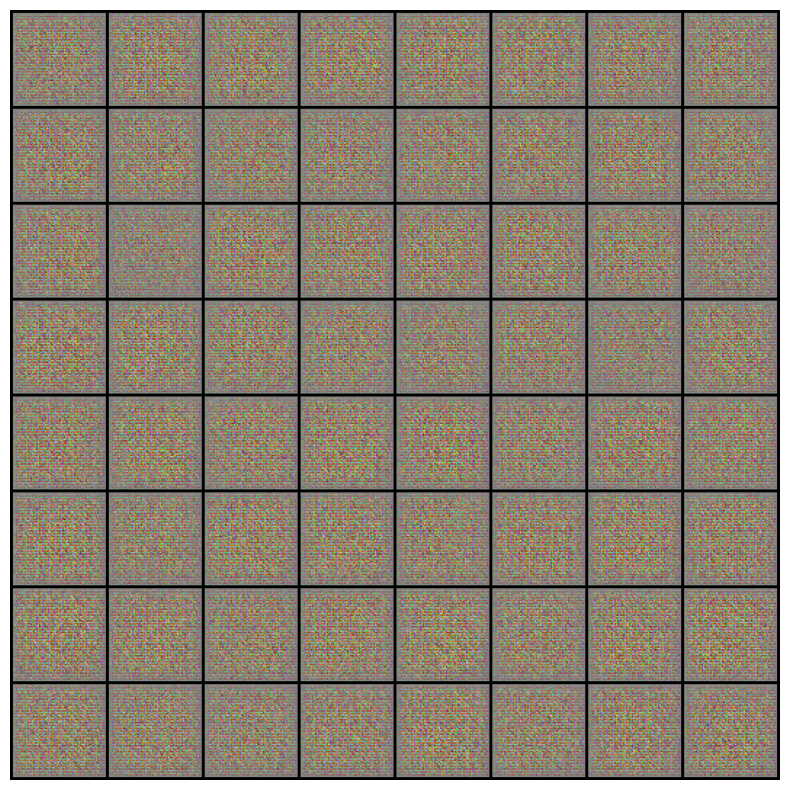

1.02 tensor(6.4801e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8116, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.04 tensor(6.2509e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8145, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.06 tensor(6.1275e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8270, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.08 tensor(6.4085e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8288, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.1 tensor(6.2447e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8434, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.12 tensor(6.3652e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8498, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.1400000000000001 tensor(6.1903e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8164, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.16 tensor(6.0204e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8437, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.18 tensor(6.1805e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8325, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.2 tensor(6.3777e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7846, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.22 tensor(6.3343e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7999, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.24 tensor(6.2890e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8033, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.26 tensor(6.2826e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8063, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.28 tensor(6.2349e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8291, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.3 tensor(6.2862e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8402, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.32 tensor(6.2254e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7974, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.34 tensor(6.2370e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8481, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.3599999999999999 tensor(6.2650e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8189, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.38 tensor(6.2386e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8274, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.4 tensor(6.2558e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8128, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.42 tensor(6.2571e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8337, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.44 tensor(6.2506e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8111, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.46 tensor(6.2327e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8347, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.48 tensor(6.0805e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8629, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.5 tensor(6.1471e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8286, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.52 tensor(6.1043e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8219, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.54 tensor(6.1439e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8596, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.56 tensor(6.2591e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.7972, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.58 tensor(6.2417e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8217, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.6 tensor(6.2408e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8086, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.62 tensor(6.1718e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8345, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.6400000000000001 tensor(6.0697e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8508, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.6600000000000001 tensor(6.0590e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8393, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.6800000000000002 tensor(6.1511e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8513, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.7 tensor(6.1394e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8317, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.72 tensor(6.0578e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8558, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.74 tensor(6.0741e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8540, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.76 tensor(6.0690e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8580, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.78 tensor(6.0928e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8533, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.8 tensor(6.0808e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8636, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.8199999999999998 tensor(6.2022e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8352, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.8399999999999999 tensor(5.9863e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8769, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.8599999999999999 tensor(6.0337e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8583, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.88 tensor(6.1343e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8291, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.9 tensor(6.1156e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8220, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.92 tensor(6.0915e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8361, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.94 tensor(6.0471e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8344, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.96 tensor(6.0243e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8581, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

1.98 tensor(5.8757e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8841, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.0 tensor(6.0730e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8594, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2

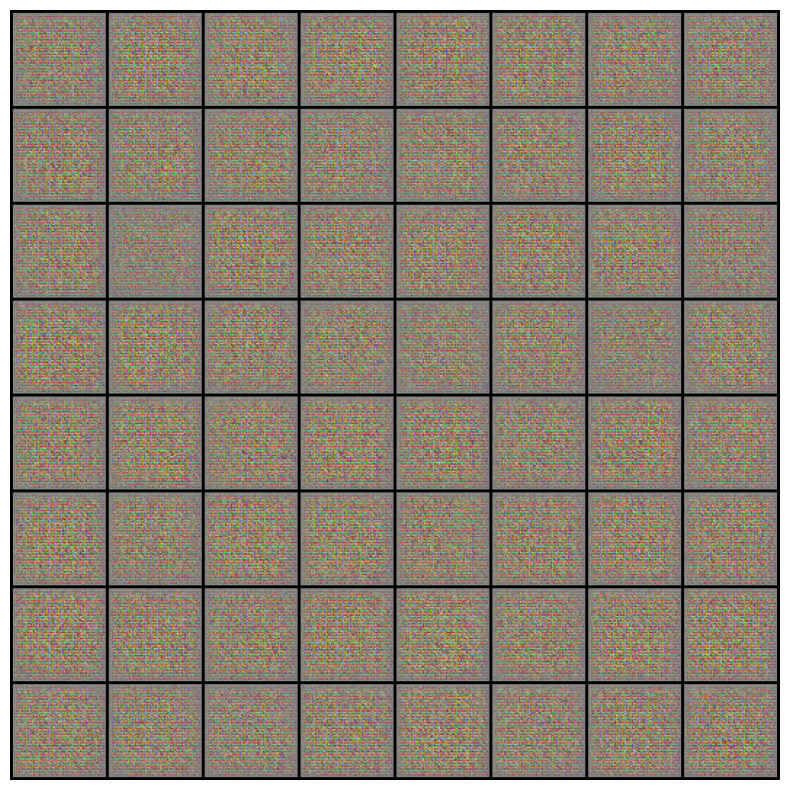

2.02 tensor(6.0040e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8375, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.04 tensor(5.9696e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8863, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.06 tensor(5.9416e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8587, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.08 tensor(6.0500e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8669, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.1 tensor(5.9920e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8609, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.12 tensor(6.0328e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8555, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.14 tensor(5.9755e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8843, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.16 tensor(6.1938e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8374, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.18 tensor(5.9286e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8741, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.2 tensor(6.0400e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8494, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.22 tensor(6.0282e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8642, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.24 tensor(6.0353e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8839, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.26 tensor(5.9365e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8580, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.2800000000000002 tensor(6.1658e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8685, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.3 tensor(5.9873e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8630, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.32 tensor(5.8718e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8771, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.34 tensor(5.8691e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8822, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.36 tensor(5.8769e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8986, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.38 tensor(5.9347e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8834, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.4 tensor(5.8428e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8920, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.42 tensor(6.0841e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8432, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.44 tensor(6.0232e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8712, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.46 tensor(5.8008e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9086, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.48 tensor(5.9648e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8744, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.5 tensor(5.9380e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8604, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.52 tensor(5.9002e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8844, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.54 tensor(5.8748e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8883, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.56 tensor(6.0002e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8586, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.58 tensor(6.0096e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8656, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.6 tensor(5.8416e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8975, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.62 tensor(5.9942e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8669, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.64 tensor(5.7098e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9206, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.66 tensor(5.9711e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8569, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.68 tensor(5.6984e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9363, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.7 tensor(5.8139e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8743, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.7199999999999998 tensor(5.9375e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8758, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.74 tensor(5.8952e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8821, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.76 tensor(5.8862e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8735, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.7800000000000002 tensor(5.7644e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9209, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.8 tensor(5.8777e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8769, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.82 tensor(5.7092e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9155, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.84 tensor(5.8094e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8783, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.86 tensor(5.9231e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8707, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.88 tensor(5.8767e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8864, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.9 tensor(5.8233e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8962, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.92 tensor(5.7907e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9094, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.94 tensor(5.6699e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9410, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.96 tensor(5.8963e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8860, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

2.98 tensor(5.8247e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8940, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.0 tensor(5.7664e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8949, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3

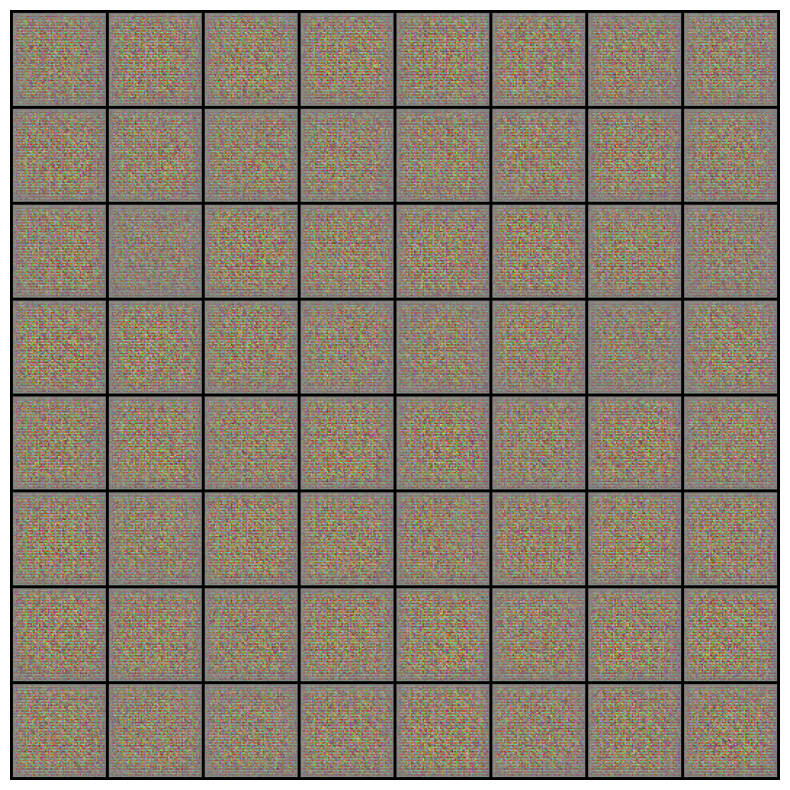

3.02 tensor(5.8300e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9014, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.04 tensor(5.7253e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9155, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.06 tensor(5.6874e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9361, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.08 tensor(5.8232e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8747, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.1 tensor(5.8302e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8839, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.12 tensor(5.8086e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8769, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.14 tensor(5.8278e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8933, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.16 tensor(5.6763e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9143, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.18 tensor(5.6163e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9308, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.2 tensor(5.7563e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9155, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.22 tensor(5.7384e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9050, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.24 tensor(5.8086e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8931, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.26 tensor(5.6623e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9019, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.2800000000000002 tensor(5.8099e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9174, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.3 tensor(5.6959e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8835, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.32 tensor(5.6392e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9270, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.34 tensor(5.6774e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9518, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.36 tensor(5.7848e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9063, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.38 tensor(5.5242e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9618, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.4 tensor(5.8059e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9121, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.42 tensor(5.7728e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9075, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.44 tensor(5.6165e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9153, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.46 tensor(5.6971e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9167, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.48 tensor(5.6530e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9098, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.5 tensor(5.6101e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9483, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.52 tensor(5.6684e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9267, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.54 tensor(5.7486e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9022, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.56 tensor(5.6668e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9369, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.58 tensor(5.7951e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9279, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.6 tensor(5.7453e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9054, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.62 tensor(5.6379e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9316, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.64 tensor(5.7308e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9233, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.66 tensor(5.7933e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.8893, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.68 tensor(5.6393e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9248, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.7 tensor(5.5462e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9503, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.7199999999999998 tensor(5.7207e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9421, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.74 tensor(5.6789e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9129, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.76 tensor(5.5348e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9323, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.7800000000000002 tensor(5.6894e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9181, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.8 tensor(5.6277e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9305, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.82 tensor(5.7736e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9027, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.84 tensor(5.5826e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9627, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.86 tensor(5.6702e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9405, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.88 tensor(5.4723e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9574, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.9 tensor(5.5748e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9180, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.92 tensor(5.6224e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9236, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.94 tensor(5.4921e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9414, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.96 tensor(5.5985e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9498, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

3.98 tensor(5.3945e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9885, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.0 tensor(5.6536e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9219, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4

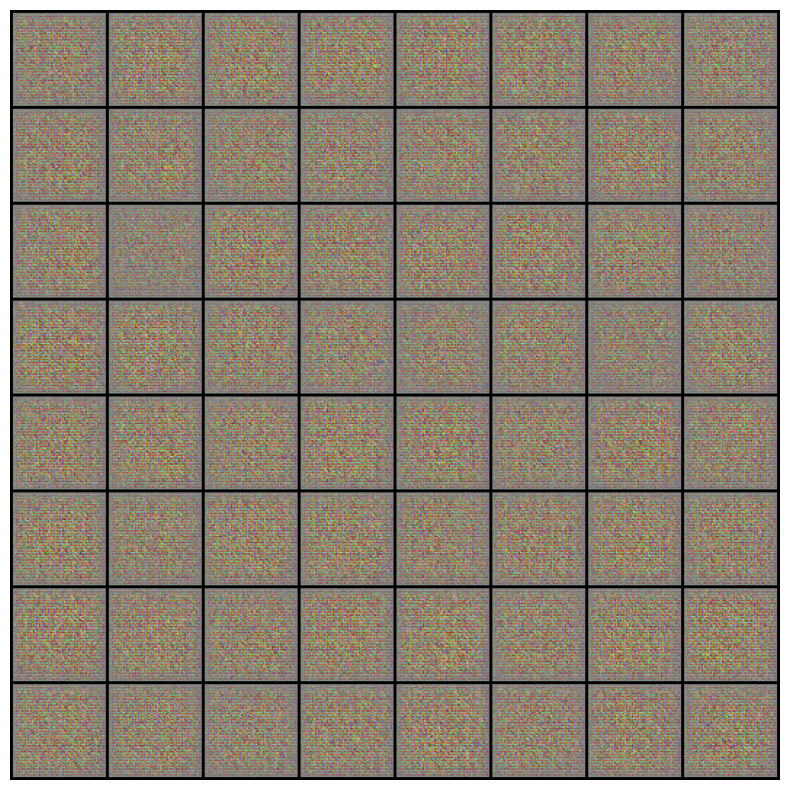

4.02 tensor(5.3977e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9934, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.04 tensor(5.6155e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9234, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.06 tensor(5.4572e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9570, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.08 tensor(5.5244e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9505, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.1 tensor(5.7006e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9149, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.12 tensor(5.6266e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9390, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.14 tensor(5.6986e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9133, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.16 tensor(5.4765e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9467, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.18 tensor(5.6239e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9325, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.2 tensor(5.4351e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9739, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.22 tensor(5.4301e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9642, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.24 tensor(5.4941e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9568, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.26 tensor(5.5002e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9738, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.28 tensor(5.7011e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9234, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.3 tensor(5.4550e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9480, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.32 tensor(5.4305e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9559, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.34 tensor(5.5463e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9638, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.36 tensor(5.4295e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9585, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.38 tensor(5.5855e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9673, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.4 tensor(5.5638e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9630, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.42 tensor(5.5400e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9535, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.44 tensor(5.5156e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9440, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.46 tensor(5.4307e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9606, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.48 tensor(5.4525e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9524, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.5 tensor(5.4203e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9708, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.52 tensor(5.4200e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9671, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.54 tensor(5.4378e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9629, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.5600000000000005 tensor(5.3983e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9686, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.58 tensor(5.3276e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0002, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.6 tensor(5.4103e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9557, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.62 tensor(5.4206e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9718, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.64 tensor(5.3573e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9808, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.66 tensor(5.5732e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9667, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.68 tensor(5.4308e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9605, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.7 tensor(5.2488e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9977, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.72 tensor(5.4510e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9684, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.74 tensor(5.2400e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0027, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.76 tensor(5.3350e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9615, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.78 tensor(5.4300e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9589, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.8 tensor(5.3179e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9876, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.82 tensor(5.4164e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9403, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.84 tensor(5.3761e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9954, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.86 tensor(5.3675e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9858, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.88 tensor(5.4143e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9680, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.9 tensor(5.4221e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9804, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.92 tensor(5.4439e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9727, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.9399999999999995 tensor(5.3579e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9607, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.96 tensor(5.1984e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0010, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

4.98 tensor(5.4827e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9741, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.0 tensor(5.3284e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9708, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5

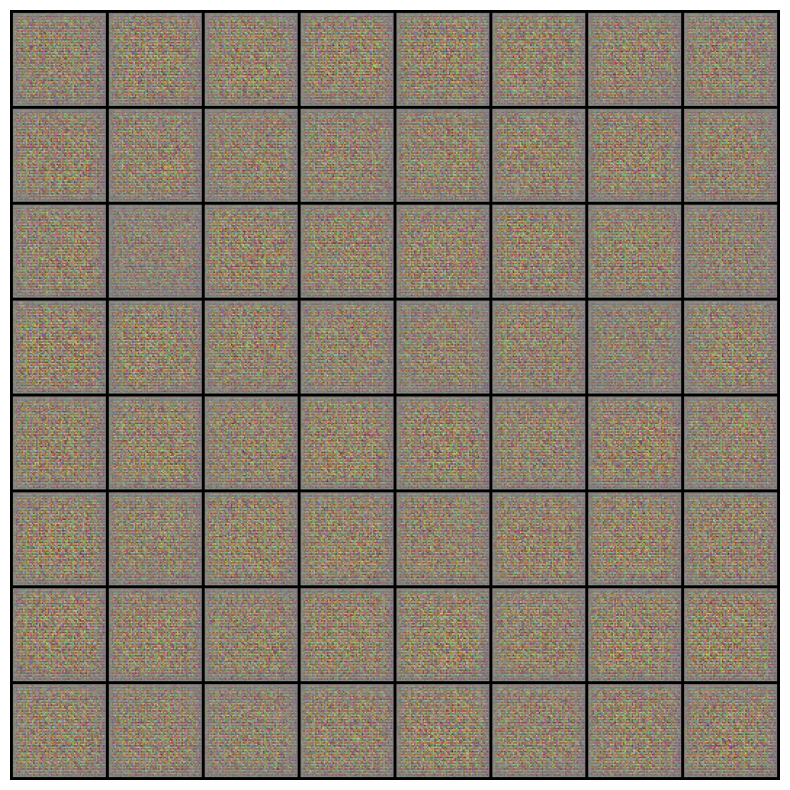

5.02 tensor(5.4739e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9742, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.04 tensor(5.3386e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0218, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.06 tensor(5.1859e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0210, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.08 tensor(5.2812e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9862, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.1 tensor(5.3844e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9504, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.12 tensor(5.3417e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9872, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.14 tensor(5.2822e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9861, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.16 tensor(5.3463e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9927, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.18 tensor(5.1833e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0082, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.2 tensor(5.3399e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9835, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.22 tensor(5.2683e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0096, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.24 tensor(5.2697e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9793, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.26 tensor(5.1892e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0290, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.28 tensor(5.2543e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9837, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.3 tensor(5.3921e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9571, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.32 tensor(5.1000e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0547, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.34 tensor(5.2276e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0066, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.36 tensor(5.3404e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9890, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.38 tensor(5.2769e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0186, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.4 tensor(5.2606e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9987, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.42 tensor(5.2121e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0044, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.44 tensor(5.2713e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9697, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.46 tensor(5.3482e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0092, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.48 tensor(5.3409e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9790, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.5 tensor(5.3707e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9800, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.52 tensor(5.2246e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9802, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.54 tensor(5.3284e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9860, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.5600000000000005 tensor(5.0623e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0319, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.58 tensor(5.1111e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0392, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.6 tensor(5.2406e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0173, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.62 tensor(5.1967e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0069, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.64 tensor(5.4004e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0075, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.66 tensor(5.2674e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9871, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.68 tensor(5.3415e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9852, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.7 tensor(5.1936e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0324, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.72 tensor(5.1577e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0296, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.74 tensor(5.1753e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9977, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.76 tensor(5.2020e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0012, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.78 tensor(5.1931e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0150, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.8 tensor(5.1683e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0019, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.82 tensor(5.1731e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0094, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.84 tensor(5.0769e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0266, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.86 tensor(5.2594e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9984, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.88 tensor(5.2281e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0028, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.9 tensor(5.2282e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0359, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.92 tensor(5.2016e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(12.9988, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.9399999999999995 tensor(5.2216e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0110, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.96 tensor(5.1044e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0187, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

5.98 tensor(5.1423e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0072, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.0 tensor(5.1307e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0256, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6

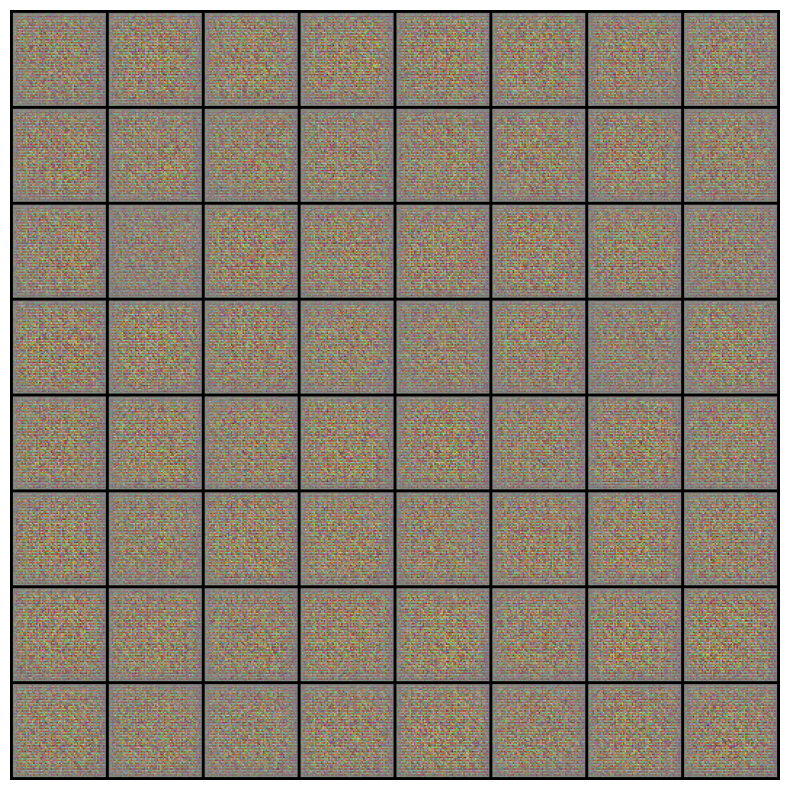

6.02 tensor(5.1017e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0164, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.04 tensor(5.2020e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0366, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.06 tensor(5.1475e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0099, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.08 tensor(5.1511e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0182, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.1 tensor(5.1382e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0487, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.12 tensor(5.0887e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0491, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.14 tensor(5.0785e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0455, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.16 tensor(5.0628e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0036, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.18 tensor(5.1359e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0332, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.2 tensor(5.0845e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0272, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.22 tensor(5.0508e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0358, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.24 tensor(5.2739e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0035, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.26 tensor(5.1557e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0044, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.28 tensor(5.0727e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0220, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.3 tensor(5.1583e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0280, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.32 tensor(5.1150e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0291, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.34 tensor(5.0583e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0225, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.36 tensor(5.0402e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0302, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.38 tensor(5.0784e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0425, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.4 tensor(5.0472e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0319, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.42 tensor(4.9782e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0404, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.44 tensor(5.1566e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0298, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.46 tensor(5.0779e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0400, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.48 tensor(5.0405e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0454, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.5 tensor(5.0481e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0791, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.52 tensor(5.1185e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0327, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.54 tensor(5.0710e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0319, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.5600000000000005 tensor(5.0517e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0518, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.58 tensor(4.9805e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0557, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.6 tensor(5.0289e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0428, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.62 tensor(4.9310e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0808, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.64 tensor(5.0396e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0445, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.66 tensor(5.0055e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0299, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.68 tensor(5.0247e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0337, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.7 tensor(4.9891e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0475, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

6.72 tensor(4.8292e-06, device='cuda:0', grad_fn=<AddBackward0>) tensor(13.0936, device='cuda:0', 
grad_fn=<BinaryCrossEntropyBackward0>)

KeyboardInterrupt: ignored

In [ ]:
# log = Report(n_epochs)
import numpy as np
import torchvision.utils as vutils

!pip install -q --upgrade torch_snippets
from torch_snippets import *
# device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

for epoch in range(n_epochs):
    N = len(df.data_dl)
    for bx, (images, labels) in enumerate(df.data_dl):
        real_data, real_labels = images.to(device), labels.to(device)
        fake_labels = torch.LongTensor(np.random.randint(0, 4, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_labels, fake_data, fake_labels)
        # fake_labels = torch.LongTensor(np.random.randint(0, 4, len(real_data))).to(device)
        # fake_data = generator(noise(len(real_data)), fake_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_labels)
        pos = epoch + (1+bx)/N
        print(pos, d_loss, g_loss, end='\r')
        # log.record(pos, d_loss, g_loss
    print(epoch+1)
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)
    torch.save(generator, 'generator.pth')

In [ ]:
# Case 1:
# Calculate the latent space arithmetic.
# Separate Training and testing data for Non-Alzheimer, and other levels
# Take the average of training data from Non-Alzheimer cases, and level 1 Alzheimer
# Subtract Non-Alzheimer cases average from Alzheimer level 1 average, get Alzheimer-1 level components
# Take the test data fro non-alzheimer case, and add alzheimer level 1 component.
# Check the error rate
# Generate Non-Alzheimer images
# Add this Alzheimer-1 with Non-Alzheimer images
# log = Report(n_epochs)


import numpy as np
import torchvision.utils as vutils

!pip install -q --upgrade torch_snippets
from torch_snippets import *
# device = "cuda" if torch.cuda.is_available() else "cpu"
from torchvision.utils import make_grid
from torch_snippets import *
from PIL import Image
import torchvision
from torchvision import transforms
import torchvision.utils as vutils

for epoch in range(n_epochs):
    N = len(df.data_dl)
    for bx, (images, labels) in enumerate(df.data_dl):
        real_data, real_labels = images.to(device), labels.to(device)
        fake_labels = torch.LongTensor(np.random.randint(0, 4, len(real_data))).to(device)
        fake_data = generator(noise(len(real_data)), fake_labels)
        fake_data = fake_data.detach()
        d_loss = discriminator_train_step(real_data, real_labels, fake_data, fake_labels)
        # fake_labels = torch.LongTensor(np.random.randint(0, 4, len(real_data))).to(device)
        # fake_data = generator(noise(len(real_data)), fake_labels).to(device)
        g_loss = generator_train_step(fake_data, fake_labels)
        pos = epoch + (1+bx)/N
        print(pos, d_loss, g_loss, end='\r')
        # log.record(pos, d_loss, g_loss
    print(epoch+1)
    with torch.no_grad():
        fake = generator(fixed_noise, fixed_fake_labels).detach().cpu()
        imgs = vutils.make_grid(fake, padding=2, normalize=True).permute(1,2,0)
        img_list.append(imgs)
        show(imgs, sz=10)
